### PPO AGENT:

#### Load the dataset and preprocess the dataframe in the required format.

Technical indicators created for the environment include:

- RSI
- MACD
- Stoch_k
- OBV
- Upper_BB
- ATR_1
- ATR_2
- ATR_5
- ATR_10
- ATR_20

In [1]:
import pandas as pd
import numpy as np
import talib as ta

class TechnicalIndicators:
    def __init__(self, data):
        self.data = data

    def add_momentum_indicators(self):
        self.data['RSI'] = ta.RSI(self.data['Close'], timeperiod=14)
        self.data['MACD'], self.data['MACD_signal'], self.data['MACD_hist'] = ta.MACD(self.data['Close'], fastperiod=12, slowperiod=26, signalperiod=9)
        self.data['Stoch_k'], self.data['Stoch_d'] = ta.STOCH(self.data['High'], self.data['Low'], self.data['Close'],
                                                              fastk_period=14, slowk_period=3, slowd_period=3)

    def add_volume_indicators(self):
        self.data['OBV'] = ta.OBV(self.data['Close'], self.data['Volume'])

    def add_volatility_indicators(self):
        self.data['Upper_BB'], self.data['Middle_BB'], self.data['Lower_BB'] = ta.BBANDS(self.data['Close'], timeperiod=20)
        self.data['ATR_1'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=1)
        self.data['ATR_2'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=2)
        self.data['ATR_5'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=5)
        self.data['ATR_10'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=10)
        self.data['ATR_20'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=20)

    def add_trend_indicators(self):
        self.data['ADX'] = ta.ADX(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=14)
        self.data['+DI'] = ta.PLUS_DI(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=14)
        self.data['-DI'] = ta.MINUS_DI(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=14)
        self.data['CCI'] = ta.CCI(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=5)

    def add_other_indicators(self):
        self.data['DLR'] = np.log(self.data['Close'] / self.data['Close'].shift(1))
        self.data['TWAP'] = self.data['Close'].expanding().mean()
        self.data['VWAP'] = (self.data['Volume'] * (self.data['High'] + self.data['Low']) / 2).cumsum() / self.data['Volume'].cumsum()

    def add_all_indicators(self):
        self.add_momentum_indicators()
        self.add_volume_indicators()
        self.add_volatility_indicators()
        self.add_trend_indicators()
        self.add_other_indicators()
        return self.data

/var/folders/c9/mmlf60b1161blllcc3lf_mz00000gn/T/ipykernel_81623/2724099111.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
data = pd.read_csv('/Users/proddy/Blockhouse/Blockhouse-ML/xnas-itch-20230703.tbbo.csv')

# Preprocessing to create necessary columns
data['price']=data['price']/1e9
data['bid_px_00']=data['bid_px_00']/1e9
data['ask_px_00']=data['ask_px_00']/1e9

data['Close'] = data['price']
data['Volume'] = data['size']
data['High'] = data[['bid_px_00', 'ask_px_00']].max(axis=1)
data['Low'] = data[['bid_px_00', 'ask_px_00']].min(axis=1)
data['Open'] = data['Close'].shift(1).fillna(data['Close'])


ti = TechnicalIndicators(data)
df_with_indicators = ti.add_all_indicators()
market_features_df = df_with_indicators[35:]

Checking the dataset:

In [3]:
# Show all columns in pandas
pd.set_option('display.max_columns', None)

market_features_df.head(35)

,ts_recv,ts_event,rtype,publisher_id,instrument_id,action,side,depth,price,size,flags,ts_in_delta,sequence,bid_px_00,ask_px_00,bid_sz_00,ask_sz_00,bid_ct_00,ask_ct_00,symbol,Close,Volume,High,Low,Open,RSI,MACD,MACD_signal,MACD_hist,Stoch_k,Stoch_d,OBV,Upper_BB,Middle_BB,Lower_BB,ATR_1,ATR_2,ATR_5,ATR_10,ATR_20,ADX,+DI,-DI,CCI,DLR,TWAP,VWAP
35,1688371212400103305,1688371212399937688,1,2,32,T,B,0,194.05,56,130,165617,324353,194.00,194.05,3079,56,2,1,AAPL,194.05,56,194.05,194.00,194.05,51.852848,-2.561087,-3.619556,1.058469,99.974582,99.974582,-282.0,254.713931,186.1505,117.587069,0.05,7.422578,23.240495,19.656509,12.550193,69.565924,51.717387,47.989962,0.000000,0.000000,189.649722,192.248240
36,1688371214386057385,1688371214385893078,1,2,32,T,N,0,194.05,50,130,164307,326232,194.00,194.30,3101,19,4,10,AAPL,194.05,50,194.30,194.00,194.05,51.852848,-1.532555,-3.202156,1.669601,99.930172,99.959779,-282.0,254.718308,186.1535,117.588692,0.30,3.861289,18.652396,17.720858,11.937684,64.872152,51.762467,47.921535,166.666667,0.000000,189.768649,192.297868
37,1688371214386063777,1688371214385899379,1,2,32,T,N,0,194.05,50,130,164398,326233,194.00,194.30,3101,19,4,10,AAPL,194.05,50,194.30,194.00,194.05,51.852848,-0.709260,-2.703577,1.994317,99.885761,99.930172,-282.0,254.721956,186.1560,117.590044,0.30,2.080645,14.981917,15.978772,11.355800,60.513649,51.683105,47.848062,83.333333,0.000000,189.881316,192.344972
38,1688371215804852019,1688371215804687301,1,2,32,T,B,0,194.21,10,130,164718,328131,194.00,194.21,3101,29,4,1,AAPL,194.21,10,194.21,194.00,194.05,51.895447,-0.043381,-2.171538,2.128156,99.875196,99.897043,-272.0,254.737322,186.1665,117.595678,0.21,1.145322,12.027533,14.401895,10.798510,56.466467,51.623439,47.792823,79.268293,0.000824,189.992308,192.353879
39,1688371216978631317,1688371216978466819,1,2,470,T,A,0,114.57,43,130,164498,329439,114.57,114.76,43,27,1,1,AMD,114.57,43,114.76,114.57,194.21,35.201020,-5.874236,-2.912077,-2.962159,83.062571,94.274509,-315.0,257.373490,182.1950,107.016510,79.64,40.392661,25.550027,20.925705,14.240584,54.540006,35.082367,64.436445,-166.666667,-0.527754,188.106750,190.699287
40,1688371216979032050,1688371216978867884,1,2,470,T,A,0,114.50,34,130,164166,329441,114.50,114.76,200,27,1,1,AMD,114.50,34,114.76,114.50,114.57,35.190304,-10.381210,-4.405904,-5.975307,66.235140,83.057636,-349.0,258.701388,178.2200,97.738612,0.26,20.326331,20.492021,18.859135,13.541555,52.752683,35.042890,64.394233,-83.374090,-0.000611,186.311463,189.439493
41,1688371218378355117,1688371218378190903,1,2,470,T,A,0,114.50,65,130,164214,330480,114.50,114.76,166,27,1,1,AMD,114.50,65,114.76,114.50,114.50,35.190304,-13.794012,-6.283525,-7.510486,49.373863,66.223858,-349.0,258.958030,174.2450,89.531970,0.26,10.293165,16.445617,16.999221,12.877477,51.093027,35.000476,64.316293,-55.582723,0.000000,184.601667,187.143640
42,1688371219671476629,1688371219671312224,1,2,32,T,N,0,194.14,10,130,164405,331406,194.00,194.16,3101,400,4,1,AAPL,194.14,10,194.16,194.00,114.50,53.762353,-9.957613,-7.018343,-2.939270,66.205525,60.604843,-339.0,258.971581,174.2520,89.532419,79.66,44.976583,29.088494,23.265299,16.216603,47.982098,53.457397,45.961211,83.298401,0.528005,184.823488,187.176236
43,1688371223368835585,1688371223368671235,1,2,32,T,B,0,194.13,10,130,164350,334235,194.00,194.13,3101,400,4,1,AAPL,194.13,10,194.13,194.00,194.14,53.760270,-6.839209,-6.982516,0.143307,83.049879,66.209756,-349.0,258.984160,174.2585,89.532840,0.14,22.558291,23.298795,20.952769,15.412773,45.093378,53.428538,45.936398,83.321685,-0.000052,185.035000,187.208457
44,1688371229849940201,1688371229849775570,1,2,32,T,B,0,194.13,100,130,164631,339055,194.01,194.13,101,390,2,1,AAPL,194.13,100,194.13,194.01,194.13,53.760270,-4.318075,-6.449628,2.131553,99.859183,83.038196,-349.0,258.996737,174.2650,89.533263,0.12,11.339146,18.663036,18.869492,14.648134,42.410996,53.401927,45.913519,55.551674,0.000000,185.237111,187.515049


In [4]:
df_with_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 47 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ts_recv        147793 non-null  int64  
 1   ts_event       147793 non-null  int64  
 2   rtype          147793 non-null  int64  
 3   publisher_id   147793 non-null  int64  
 4   instrument_id  147793 non-null  int64  
 5   action         147793 non-null  object 
 6   side           147793 non-null  object 
 7   depth          147793 non-null  int64  
 8   price          147793 non-null  float64
 9   size           147793 non-null  int64  
 10  flags          147793 non-null  int64  
 11  ts_in_delta    147793 non-null  int64  
 12  sequence       147793 non-null  int64  
 13  bid_px_00      147793 non-null  float64
 14  ask_px_00      147793 non-null  float64
 15  bid_sz_00      147793 non-null  int64  
 16  ask_sz_00      147793 non-null  int64  
 17  bid_ct_00      147793 non-nul

#### Create the Trading Environment class for the PPO Agent

In [5]:
import gym
from gym import spaces
import numpy as np
import pandas as pd

class TradingEnvironment(gym.Env):
    metadata = {'render.modes': ['human']}

    def __init__(self, data, daily_trading_limit):
        super(TradingEnvironment, self).__init__()
        self.data = data
        self.daily_trading_limit = daily_trading_limit
        self.current_step = 0

        # Extract state columns
        self.state_columns = ['Close', 'Volume', 'RSI', 'MACD', 'MACD_signal', 'MACD_hist', 'Stoch_k', 'Stoch_d',
                              'OBV', 'Upper_BB', 'Middle_BB', 'Lower_BB', 'ATR_1', 'ADX', '+DI', '-DI', 'CCI']

        # Initialize balance, shares held, and total shares traded
        self.balance = 10_000_000.0  # $10 million
        self.shares_held = 0
        self.total_shares_traded = 0

        # Define action space: [Hold, Buy, Sell]
        self.action_space = spaces.Discrete(3)

        # Define observation space based on state columns
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(len(self.state_columns),), dtype=np.float32
        )

    def reset(self):
        self.current_step = 0
        self.balance = 10_000_000.0  # $10 million
        self.shares_held = 0
        self.total_shares_traded = 0
        self.cumulative_reward = 0
        self.trades = []
        return self._next_observation()

    def _next_observation(self):
        return self.data[self.state_columns].iloc[self.current_step].values

    def step(self, action):
        expected_price = self.data.iloc[self.current_step]['ask_px_00']
        actual_price = self.data.iloc[self.current_step]['price']
        transaction_time = self.data.iloc[self.current_step]['ts_in_delta']
        self._take_action(action)
        reward = 0
        
        if self.current_step >= len(self.data) - 1:
            self.current_step = 0
        if action != 0:
            transaction_cost= self._calculate_transaction_cost(self.data.iloc[self.current_step]['Volume'], 0.3, self.data['Volume'].mean())
            reward = self._calculate_reward(expected_price, actual_price, transaction_time, transaction_cost)
            self.cumulative_reward += reward
            if self.trades:
                self.trades[-1]['reward'] = reward
                self.trades[-1]['transaction_cost'] = transaction_cost
                self.trades[-1]['slippage'] = expected_price - actual_price
                self.trades[-1]['time_penalty'] = 100*transaction_time/1e9
        done = self.current_step == len(self.data) - 1
        obs = self._next_observation()
        info = {
        'step': self.current_step,
        'action': action,
        'price': actual_price,
        'shares': self.trades[-1]['shares'] if self.trades else 0
    }
        self.current_step += 1

        return obs, reward, done, info

    def _take_action(self, action):
        current_price = self.data.iloc[self.current_step]['Close']
        current_time = pd.to_datetime(self.data.iloc[self.current_step]['ts_event'])
        trade_info = {'step': self.current_step, 'timestamp': current_time, 'action': action, 'price': current_price, 'shares': 0, 'reward': 0, 'transaction_cost': 0, 'slippage': 0, 'time_penalty': 0}

        if action == 1: # and self.total_shares_traded < self.daily_trading_limit:  # Buy
            shares_bought = (self.balance * np.random.uniform(0.001, 0.005)) // current_price
            self.balance -= shares_bought * current_price
            self.shares_held += shares_bought
            self.total_shares_traded += shares_bought
            trade_info['shares'] = shares_bought
            if(shares_bought>0):
                self.trades.append(trade_info)
        elif action == 2: # and self.total_shares_traded < self.daily_trading_limit:  # Sell
            shares_sold = min((self.balance * np.random.uniform(0.001, 0.005)) // current_price, self.shares_held)
            self.balance += shares_sold * current_price
            self.shares_held -= shares_sold
            self.total_shares_traded -= shares_sold
            trade_info['shares'] = shares_sold
            if(shares_sold>0):
                self.trades.append(trade_info)

    def _calculate_reward(self, expected_price, actual_price, transaction_time, transaction_cost):
        slippage = expected_price - actual_price
        time_penalty = 100*transaction_time/1e9
        reward = - (slippage + time_penalty + transaction_cost)
        return reward
    
    def _calculate_transaction_cost(self, volume, volatility, daily_volume):
        return volatility * np.sqrt(volume / daily_volume)
    
    def run(self):
        self.reset()
        for _ in range(len(self.data)):
            self.step()
        return self.cumulative_reward, self.trades

    def render(self, mode='human', close=False):
        print(f'Step: {self.current_step}')
        print(f'Balance: {self.balance}')
        print(f'Shares held: {self.shares_held}')
        print(f'Total shares traded: {self.total_shares_traded}')
        print(f'Total portfolio value: {self.balance + self.shares_held * self.data.iloc[self.current_step]["Close"]}')
        print(f'Cumulative reward: {self.cumulative_reward}')
        self.print_trades()

    def print_trades(self):
        # download all trades in a pandas dataframe using .csv
        trades_df = pd.DataFrame(self.trades)
        # Save a csv
        trades_df.to_csv('trades_ppo.csv', index=False)
        for trade in self.trades:
            print(f"Step: {trade['step']}, Timestamp: {trade['timestamp']}, Action: {trade['action']}, Price: {trade['price']}, Shares: {trade['shares']}, Reward: {trade['reward']}, Transaction Cost: {trade['transaction_cost']}, Slippage: {trade['slippage']}, Time Penalty: {trade['time_penalty']}")

#### Train the PPO Agent with the environment and for different tickers.

In [8]:
# Define the daily trading limit (total number of shares to trade per day)
daily_trading_limit = 1000

ticker = 'AAPL'  # Specify the ticker you want to trade
ticker_data = market_features_df[market_features_df['symbol'] == ticker]

env = TradingEnvironment(ticker_data, daily_trading_limit)  # Adjust window_size if needed

In [6]:
import pandas as pd
from stable_baselines3 import PPO

# Define the daily trading limit (total number of shares to trade per day)
daily_trading_limit = 1000

ticker = 'AAPL'  # Specify the ticker you want to trade
ticker_data = market_features_df[market_features_df['symbol'] == ticker]

# Create the trading environment
env = TradingEnvironment(ticker_data, daily_trading_limit)  # Adjust window_size if needed

# Define the best hyperparameters
best_hyperparameters = {'learning_rate': 0.0009931989008886031,'n_steps': 512,'batch_size': 128, 'gamma': 0.9916829193042708,'clip_range': 0.21127653449387027,'n_epochs': 6} # type: ignore

# Create the RL model with the best hyperparameters
model = PPO('MlpPolicy', env, verbose=1, **best_hyperparameters)

# Train the model
model.learn(total_timesteps=10000)

# Save the model
model.save("trading_agent")

# Evaluate the model
obs = env.reset()
for _ in range(len(ticker_data)):
    action, _states = model.predict(obs)
    obs, rewards, done, info = env.step(action)
    if done:
        break

# Render the final state
env.render()

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/Users/proddy/Blockhouse/Blockhouse/Blockhouse/lib/python3.12/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/proddy/Blockhouse/Blockhouse/Blockhouse/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


----------------------------
| time/              |     |
|    fps             | 230 |
|    iterations      | 1   |
|    time_elapsed    | 2   |
|    total_timesteps | 512 |
----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 223         |
|    iterations           | 2           |
|    time_elapsed         | 4           |
|    total_timesteps      | 1024        |
| train/                  |             |
|    approx_kl            | 0.017060015 |
|    clip_fraction        | 0.175       |
|    clip_range           | 0.211       |
|    entropy_loss         | -1.09       |
|    explained_variance   | -0.0433     |
|    learning_rate        | 0.000993    |
|    loss                 | 0.133       |
|    n_updates            | 6           |
|    policy_gradient_loss | -0.0185     |
|    value_loss           | 0.726       |
-----------------------------------------
-----------------------------------------

### TRADING BLOTTER:

#### Preprocess the data for the trading blotter:

In [2]:
import pandas as pd
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

INITIAL_CASH = 10_000_000  # $10 million

def preprocess_data(df):
    df['liquidity'] = df['bid_sz_00'] * df['bid_px_00'] + df['ask_sz_00'] * df['ask_px_00']
    return df

def calculate_rsi(data, window=14):
    delta = data.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

def calculate_vol_and_liquidity(price_df, volume_df, window_size):
    # Calculate rolling statistics
    rolling_mean_vol = price_df.pct_change().rolling(window=window_size).mean()
    rolling_std_vol = price_df.pct_change().rolling(window=window_size).std()
    rolling_mean_liq = volume_df.rolling(window=window_size).mean()
    rolling_std_liq = volume_df.rolling(window=window_size).std()
    
    return rolling_mean_vol, rolling_std_vol, rolling_mean_liq, rolling_std_liq

def get_percentile(current_value, mean, std):
    if std > 0:
        z_score = (current_value - mean) / std
        percentile = norm.cdf(z_score)
    else:
        percentile = 0.5  # No variation
    return percentile

def get_trade_price(base_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction):
    vol_percentile = get_percentile(current_vol, mean_vol, std_vol)
    liq_percentile = get_percentile(current_liq, mean_liq, std_liq)

    # Define price adjustment scenarios based on market conditions
    if vol_percentile >= 0.9 and liq_percentile < 0.1:
        price_adjustment_percent = np.random.uniform(-0.25, -0.15)
    elif vol_percentile <= 0.1 and liq_percentile < 0.1:
        price_adjustment_percent = np.random.uniform(-0.10, -0.05)
    elif vol_percentile >= 0.9 and liq_percentile >= 0.9:
        price_adjustment_percent = np.random.uniform(-0.05, +0.10)
    else:
        price_adjustment_percent = np.random.uniform(-0.05, +0.05)  # Default for normal conditions

    # Adjust price based on trade direction
    if trade_direction == 'BUY':
        adjusted_price = base_price * (1 - price_adjustment_percent)
    else:  # SELL
        adjusted_price = base_price * (1 + price_adjustment_percent)
    
    return adjusted_price


#### Create trading environment for the blotter

In [3]:
class TradingEnvironmentwithBlotter:
    def __init__(self, data, daily_trading_limit, window_size):
        self.data = preprocess_data(data)
        self.daily_trading_limit = daily_trading_limit
        self.window_size = window_size
        self.state_columns = ['price', 'liquidity', 'RSI', 'MACD', 'MACD_signal', 'MACD_hist', 'Stoch_k', 'Stoch_d',
                              'OBV', 'Upper_BB', 'Middle_BB', 'Lower_BB', 'ATR_1', 'ADX', '+DI', '-DI', 'CCI']
        self.reset()

    def reset(self):
        self.current_step = 0
        self.balance = INITIAL_CASH
        self.shares_held = 0
        self.total_shares_traded = 0
        self.cumulative_reward = 0
        self.trades = []
        self.portfolio = {'cash': self.balance, 'holdings': {ticker: 0 for ticker in self.data['symbol'].unique()}}
        self.data['RSI'] = calculate_rsi(self.data['price'])
        self.data['pct_change'] = self.data['price'].pct_change()
        self.data['rolling_mean_vol'], self.data['rolling_std_vol'], self.data['rolling_mean_liq'], self.data['rolling_std_liq'] = calculate_vol_and_liquidity(self.data['price'], self.data['liquidity'], self.window_size)

    def step(self):
        row = self.data.iloc[self.current_step]
        current_price = row['price']
        current_time = pd.to_datetime(row['ts_event'])
        current_rsi = row['RSI']
        current_vol = row['pct_change']
        current_liq = row['liquidity']
        mean_vol = row['rolling_mean_vol']
        std_vol = row['rolling_std_vol']
        mean_liq = row['rolling_mean_liq']
        std_liq = row['rolling_std_liq']

        if current_rsi < 30:  # Entry signal based on RSI
            trade_direction = 'BUY'
            trade_price = get_trade_price(current_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction)
            trade_size = (self.portfolio['cash'] * np.random.uniform(0.001, 0.005)) / trade_price
            if self.portfolio['cash'] >= trade_size * trade_price:
                self.portfolio['cash'] -= trade_size * trade_price
                self.portfolio['holdings'][row['symbol']] += trade_size
                trade_status = 'filled'
            else:
                trade_status = 'cancelled'
        elif current_rsi > 70:  # Exit signal based on RSI
            trade_direction = 'SELL'
            if self.portfolio['holdings'][row['symbol']] > 0:
                trade_size = min(self.portfolio['holdings'][row['symbol']], self.portfolio['cash']*np.random.uniform(0.001, 0.005) / current_price)
                trade_price = get_trade_price(current_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction)
                self.portfolio['cash'] += trade_size * trade_price
                self.portfolio['holdings'][row['symbol']] -= trade_size
                trade_status = 'filled'
            else:
                trade_size = 0
                trade_status = 'cancelled'
        else:
            trade_direction = 'HOLD'
            trade_size = 0
            trade_price = current_price
            trade_status = 'skipped'

        if trade_size > 0:
            expected_price = row['ask_px_00']
            actual_price = row['price']
            transaction_time = row['ts_in_delta']
            transaction_cost = self._calculate_transaction_cost(row['Volume'], 0.3, self.data['Volume'].mean())
            slippage = expected_price - actual_price
            time_penalty = 1000 * transaction_time / 1e9
            reward = - (slippage + time_penalty + transaction_cost)
        
            self.cumulative_reward += reward
            self.trades.append({
                'step': self.current_step,
                'timestamp': current_time,
                'action': trade_direction,
                'price': trade_price,
                'shares': trade_size,
                'symbol': row['symbol'],
                'reward': reward,
                'transaction_cost': transaction_cost,
                'slippage': slippage,
                'time_penalty': time_penalty,
                'portfolio_value': self.get_portfolio_value()
            })

            

        self.current_step += 1
        if self.current_step >= len(self.data) - 1:
            done=True
            self.current_step = 0

    def _calculate_transaction_cost(self, volume, volatility, daily_volume):
        return volatility * np.sqrt(volume / daily_volume)

    def run(self):
        self.reset()
        for _ in range(len(self.data)):
            self.step()
        return self.cumulative_reward, self.trades
    
    def get_portfolio_value(self):
        row = self.data.iloc[self.current_step]
        return self.portfolio['cash'] + sum(self.portfolio['holdings'][symbol] * row['price'] for symbol in self.portfolio['holdings'])

    def calculate_metrics(self):

        trades_df = pd.DataFrame(self.trades)
    
        initial_value = INITIAL_CASH
        final_value = self.get_portfolio_value()
        total_return = (final_value - initial_value) / initial_value
        
        daily_returns = trades_df['portfolio_value'].pct_change().dropna()
        sharpe_ratio = np.sqrt(252) * daily_returns.mean() / daily_returns.std()
        
        cumulative_returns = (1 + daily_returns).cumprod()
        drawdown = (cumulative_returns.cummax() - cumulative_returns) / cumulative_returns.cummax()
        max_drawdown = drawdown.max()
        
        profitable_trades = trades_df[trades_df['action'] == 'SELL']
        win_rate = len(profitable_trades) / len(trades_df) if len(trades_df) > 0 else 0
        
        avg_profit = profitable_trades['price'].mean() * profitable_trades['shares'].mean() if len(profitable_trades) > 0 else 0
        avg_loss = (trades_df[trades_df['action'] == 'BUY']['price'].mean() * 
                    trades_df[trades_df['action'] == 'BUY']['shares'].mean())
        
        gross_profit = (profitable_trades['price'] * profitable_trades['shares']).sum()
        gross_loss = (trades_df[trades_df['action'] == 'BUY']['price'] * 
                    trades_df[trades_df['action'] == 'BUY']['shares']).sum()
        profit_factor = gross_profit / abs(gross_loss) if gross_loss != 0 else float('inf')

        # Calculate total portfolio value
        total_portfolio_value = self.get_portfolio_value()

        for trade in self.trades:
            print(f"Step: {trade['step']}, Timestamp: {trade['timestamp']}, Action: {trade['action']}, Price: {trade['price']}, Shares: {trade['shares']}, Symbol: {trade['symbol']}, Transaction Cost: {trade['transaction_cost']}, Slippage: {trade['slippage']}")

        # Plot portfolio value over time
        plt.figure(figsize=(12, 6))
        plt.plot(trades_df['timestamp'], trades_df['portfolio_value'])
        plt.title('Portfolio Value Over Time')
        plt.xlabel('Date')
        plt.ylabel('Portfolio Value')
        plt.show()
        
        return {
            'Total Return': total_return,
            'Sharpe Ratio': sharpe_ratio,
            'Max Drawdown': max_drawdown,
            'Number of Trades': len(trades_df),
            'Win Rate': win_rate,
            'Avg Profit per Trade': avg_profit,
            'Avg Loss per Trade': avg_loss,
            'Profit Factor': profit_factor,
            'Total Portfolio Value': total_portfolio_value
        }

    def render(self):
        print(f'Cumulative reward: {self.cumulative_reward}')
        row = self.data.iloc[self.current_step]
        print(f'Total portfolio value: {self.portfolio["cash"] + self.portfolio["holdings"][row["symbol"]]*row["Close"]}')
        # get trades in a pandas dataframe
        trades_df = pd.DataFrame(self.trades)
        # Save a csv
        trades_df.to_csv('trades_blotter.csv', index=False)
        for trade in self.trades:
            print(f"Step: {trade['step']}, Timestamp: {trade['timestamp']}, Action: {trade['action']}, Price: {trade['price']}, Shares: {trade['shares']}, Symbol: {trade['symbol']}, Reward: {trade['reward']}, Transaction Cost: {trade['transaction_cost']}, Slippage: {trade['slippage']}, Time Penalty: {trade['time_penalty']}")

#### Run the trading blotter

Cumulative reward: -12218.802610700597
Total portfolio value: 10006918.0237633
Step: 22, Timestamp: 2023-07-03 08:07:54.507645057, Action: BUY, Price: 188.29980530564342, Shares: 77.06042328718146, Symbol: AAPL, Reward: -0.3287686510404105, Transaction Cost: 0.08024365104036953, Slippage: 0.08000000000004093, Time Penalty: 0.168525
Step: 23, Timestamp: 2023-07-03 08:07:54.507645057, Action: BUY, Price: 197.13495890139683, Shares: 180.19305657715157, Symbol: AAPL, Reward: -0.4379552584890982, Transaction Cost: 0.17943025848903796, Slippage: 0.09000000000006025, Time Penalty: 0.168525
Step: 24, Timestamp: 2023-07-03 08:07:54.507645057, Action: BUY, Price: 203.02546706839007, Shares: 152.37142109999328, Symbol: AAPL, Reward: -0.4379552584890982, Transaction Cost: 0.17943025848903796, Slippage: 0.09000000000006025, Time Penalty: 0.168525
Step: 25, Timestamp: 2023-07-03 08:07:54.508834193, Action: BUY, Price: 201.732434874973, Shares: 223.97701210255613, Symbol: AAPL, Reward: -0.34924665104

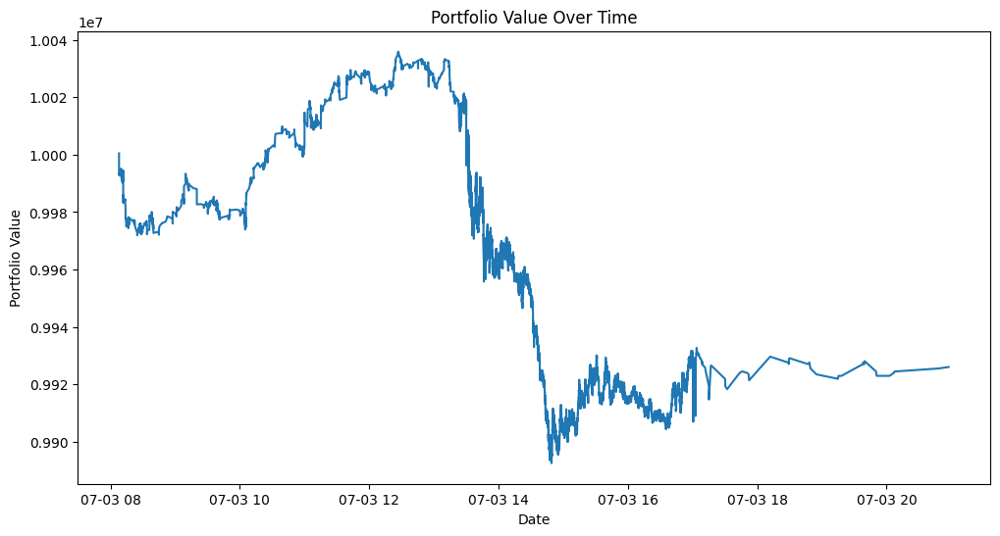

Total Return         0.0007         
Sharpe Ratio         -0.0851        
Max Drawdown         0.0143         
Number of Trades     33144.0000     
Win Rate             0.4685         
Avg Profit per Trade 2932.6617      
Avg Loss per Trade   3154.9323      
Profit Factor        0.8208         
Total Portfolio Value 10006918.0238  


In [5]:
data = pd.read_csv('data/df_with_predictions.csv')

# Filter data for the specified ticker
ticker = 'AAPL'  # Specify the ticker you want to trade
ticker_data = data[data['symbol'] == ticker]
# ticker_data = market_features_df[market_features_df['symbol'] == ticker]

window_size = 60
daily_trading_limit = 1000
# Create the trading environment
env = TradingEnvironmentwithBlotter(ticker_data, daily_trading_limit=1000, window_size=window_size)  # Daily trading limit of 1000 shares

# Run the environment
cumulative_reward, trades = env.run()

# Render the results
env.render()

# Calculate the metrics
model_metrics = env.calculate_metrics()
for metric in model_metrics.keys():
        print(f"{metric:<20} {model_metrics[metric]:<15.4f}")

In [11]:
df=market_features_df.copy()

In [12]:
df['timestamp']=pd.to_datetime(df['ts_recv'])

In [13]:
df.head()

,ts_recv,ts_event,rtype,publisher_id,instrument_id,action,side,depth,price,size,flags,ts_in_delta,sequence,bid_px_00,ask_px_00,bid_sz_00,ask_sz_00,bid_ct_00,ask_ct_00,symbol,Close,Volume,High,Low,Open,RSI,MACD,MACD_signal,MACD_hist,Stoch_k,Stoch_d,OBV,Upper_BB,Middle_BB,Lower_BB,ATR_1,ATR_2,ATR_5,ATR_10,ATR_20,ADX,+DI,-DI,CCI,DLR,TWAP,VWAP,timestamp
35,1688371212400103305,1688371212399937688,1,2,32,T,B,0,194.05,56,130,165617,324353,194.00,194.05,3079,56,2,1,AAPL,194.05,56,194.05,194.00,194.05,51.852848,-2.561087,-3.619556,1.058469,99.974582,99.974582,-282.0,254.713931,186.1505,117.587069,0.05,7.422578,23.240495,19.656509,12.550193,69.565924,51.717387,47.989962,0.000000,0.000000,189.649722,192.248240,2023-07-03 08:00:12.400103305
36,1688371214386057385,1688371214385893078,1,2,32,T,N,0,194.05,50,130,164307,326232,194.00,194.30,3101,19,4,10,AAPL,194.05,50,194.30,194.00,194.05,51.852848,-1.532555,-3.202156,1.669601,99.930172,99.959779,-282.0,254.718308,186.1535,117.588692,0.30,3.861289,18.652396,17.720858,11.937684,64.872152,51.762467,47.921535,166.666667,0.000000,189.768649,192.297868,2023-07-03 08:00:14.386057385
37,1688371214386063777,1688371214385899379,1,2,32,T,N,0,194.05,50,130,164398,326233,194.00,194.30,3101,19,4,10,AAPL,194.05,50,194.30,194.00,194.05,51.852848,-0.709260,-2.703577,1.994317,99.885761,99.930172,-282.0,254.721956,186.1560,117.590044,0.30,2.080645,14.981917,15.978772,11.355800,60.513649,51.683105,47.848062,83.333333,0.000000,189.881316,192.344972,2023-07-03 08:00:14.386063777
38,1688371215804852019,1688371215804687301,1,2,32,T,B,0,194.21,10,130,164718,328131,194.00,194.21,3101,29,4,1,AAPL,194.21,10,194.21,194.00,194.05,51.895447,-0.043381,-2.171538,2.128156,99.875196,99.897043,-272.0,254.737322,186.1665,117.595678,0.21,1.145322,12.027533,14.401895,10.798510,56.466467,51.623439,47.792823,79.268293,0.000824,189.992308,192.353879,2023-07-03 08:00:15.804852019
39,1688371216978631317,1688371216978466819,1,2,470,T,A,0,114.57,43,130,164498,329439,114.57,114.76,43,27,1,1,AMD,114.57,43,114.76,114.57,194.21,35.201020,-5.874236,-2.912077,-2.962159,83.062571,94.274509,-315.0,257.373490,182.1950,107.016510,79.64,40.392661,25.550027,20.925705,14.240584,54.540006,35.082367,64.436445,-166.666667,-0.527754,188.106750,190.699287,2023-07-03 08:00:16.978631317
